In [8]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, models
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from PIL import Image

In [9]:
dataset_dir = 'animals/animals'

In [10]:
class_dirs = os.listdir(dataset_dir)
num_classes = len(class_dirs)
class_dirs = os.listdir(dataset_dir)
num_classes = len(class_dirs)
image_paths = []
labels = []

# Iterate over class directories
for class_dir in class_dirs:
    # Get the path to the class directory
    class_dir_path = os.path.join(dataset_dir, class_dir)
    # Iterate over files in the class directory
    for file_name in os.listdir(class_dir_path):
        # Construct the full path to the image file
        image_path = os.path.join(class_dir_path, file_name)
        # Append the image path to the list
        image_paths.append(image_path)
        # Append the label (class index) to the list
        labels.append(class_dirs.index(class_dir))

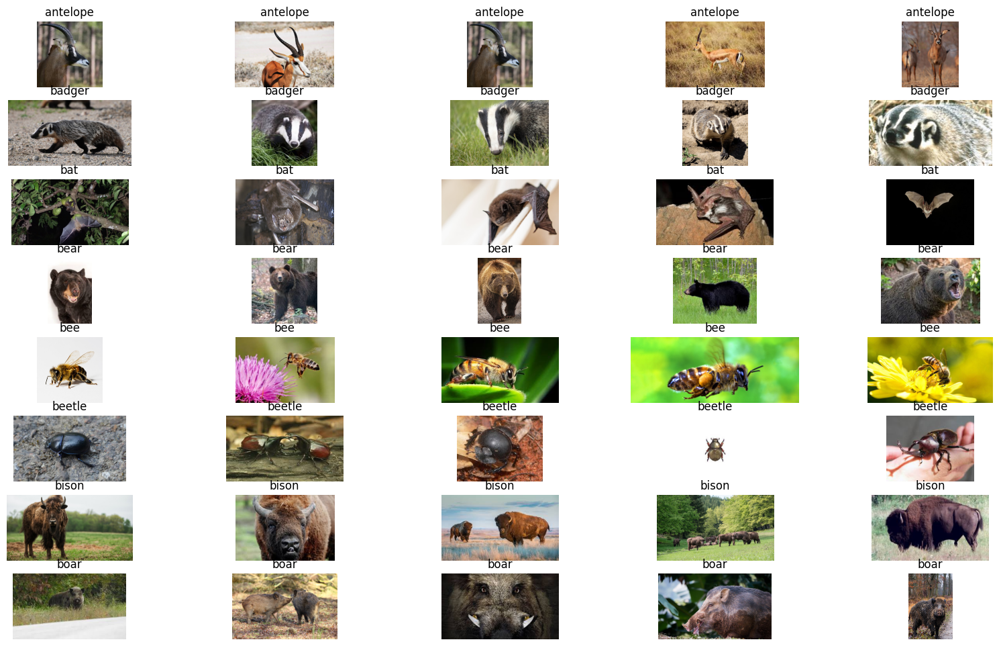

In [90]:
from pathlib import Path
labels = os.listdir('animals/animals')
path = Path('animals/animals')
def displayRandomImagesFromEveryFolder(directory=path, samplesPerFolder=5):

    fig = plt.figure(figsize=(20,15))

    for rowIndex in range(1, 9):
        subdirectory = str(rowIndex)
        path = directory/labels[rowIndex -1]
        images = os.listdir(path)
        for sampleIndex in range(1,samplesPerFolder+1):
            randomNumber = random.randint(0, len(images)-1)
            image = Image.open(path/images[randomNumber])
            ax = fig.add_subplot(10, 5, samplesPerFolder*rowIndex + sampleIndex)
            ax.axis("off")

            plt.title(str(labels[rowIndex -1]))
            plt.imshow(image, cmap='gray')


    plt.show()

displayRandomImagesFromEveryFolder()

In [80]:
# Print class names with corresponding numbers
import os

class_dirs = os.listdir(dataset_dir)
num_classes = len(class_dirs)
class_names = {}  # Dictionary to store class names

# Iterate over class directories and assign names
for i, class_dir in enumerate(class_dirs):
    class_names[i] = class_dir

# Print class names with corresponding numbers
for class_index, class_name in class_names.items():
    print(f"Class {class_index}: {class_name}")


Class 0: antelope
Class 1: badger
Class 2: bat
Class 3: bear
Class 4: bee
Class 5: beetle
Class 6: bison
Class 7: boar
Class 8: butterfly
Class 9: cat
Class 10: caterpillar
Class 11: chimpanzee
Class 12: cockroach
Class 13: cow
Class 14: coyote
Class 15: crab
Class 16: crow
Class 17: deer
Class 18: dog
Class 19: dolphin
Class 20: donkey
Class 21: dragonfly
Class 22: duck
Class 23: eagle
Class 24: elephant
Class 25: flamingo
Class 26: fly
Class 27: fox
Class 28: goat
Class 29: goldfish
Class 30: goose
Class 31: gorilla
Class 32: grasshopper
Class 33: hamster
Class 34: hare
Class 35: hedgehog
Class 36: hippopotamus
Class 37: hornbill
Class 38: horse
Class 39: hummingbird
Class 40: hyena
Class 41: jellyfish
Class 42: kangaroo
Class 43: koala
Class 44: ladybugs
Class 45: leopard
Class 46: lion
Class 47: lizard
Class 48: lobster
Class 49: mosquito
Class 50: moth
Class 51: mouse
Class 52: octopus
Class 53: okapi
Class 54: orangutan
Class 55: otter
Class 56: owl
Class 57: ox
Class 58: oyster


In [12]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224
    transforms.ToTensor(),           # Convert image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize pixel values
])

In [13]:
class CustomDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, label
dataset = CustomDataset(image_paths, labels, transform=transform)

X_trainval, X_test, y_trainval, y_test = train_test_split(dataset.image_paths, dataset.labels, test_size=0.2, random_state=42)

# Split the trainval set into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_trainval, y_trainval, test_size=0.2, random_state=42)

# Create custom dataset instances
train_dataset = CustomDataset(X_train, y_train, transform=transform)
val_dataset = CustomDataset(X_val, y_val, transform=transform)
test_dataset = CustomDataset(X_test, y_test, transform=transform)


In [14]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [15]:
import torch
import torch.nn as nn

class BasicCNN(nn.Module):
    def __init__(self, num_classes):
        super(BasicCNN, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        # Max pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        # Fully connected layers
        self.fc1 = nn.Linear(64 * 56 * 56, 512)  # Assuming input image size is 224x224
        self.fc2 = nn.Linear(512, num_classes)

    def forward(self, x):
        # Convolutional layers with ReLU activation and max pooling
        x = self.pool(nn.ReLU()(self.conv1(x)))
        x = self.pool(nn.ReLU()(self.conv2(x)))
        # Flatten the output for the fully connected layers
        x = x.view(-1, 64 * 56 * 56)  # Assuming input image size is 224x224
        # Fully connected layers with ReLU activation
        x = nn.ReLU()(self.fc1(x))
        x = self.fc2(x)
        return x

# Create an instance of the BasicCNN model
num_classes = 90  # Example: 90 classes for classification
model = BasicCNN(num_classes)

# Print the model architecture
print(model)


BasicCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=90, bias=True)
)


In [16]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [17]:
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    for images, labels in train_loader:
        optimizer.zero_grad()
        try:
            outputs = model(images)
        except FileNotFoundError as e:
            print("FileNotFoundError occurred. Skipping:", e)
            continue  # Skip this batch and continue with the next one
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
    train_loss = running_loss / len(train_loader)
    train_accuracy = correct / total

    # Validate the model
    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            try:
                outputs = model(images)
            except FileNotFoundError as e:
                print("FileNotFoundError occurred. Skipping:", e)
                continue  # Skip this batch and continue with the next one
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()
    val_loss = val_running_loss / len(val_loader)
    val_accuracy = val_correct / val_total

    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {100*train_accuracy:.2f}%, Val Loss: {val_loss:.4f}, Val Accuracy: {100*val_accuracy:.2f}%')


Epoch [1/10], Train Loss: 5.1834, Train Accuracy: 1.10%, Val Loss: 4.4333, Val Accuracy: 0.69%
Epoch [2/10], Train Loss: 4.4107, Train Accuracy: 2.08%, Val Loss: 4.3949, Val Accuracy: 2.08%
Epoch [3/10], Train Loss: 4.3537, Train Accuracy: 3.47%, Val Loss: 4.2640, Val Accuracy: 4.17%
Epoch [4/10], Train Loss: 3.5550, Train Accuracy: 20.49%, Val Loss: 4.0416, Val Accuracy: 19.79%
Epoch [5/10], Train Loss: 1.1653, Train Accuracy: 72.22%, Val Loss: 4.9734, Val Accuracy: 25.46%
Epoch [6/10], Train Loss: 0.1428, Train Accuracy: 96.85%, Val Loss: 6.3102, Val Accuracy: 26.16%
Epoch [7/10], Train Loss: 0.0235, Train Accuracy: 99.42%, Val Loss: 6.9633, Val Accuracy: 26.50%
Epoch [8/10], Train Loss: 0.0291, Train Accuracy: 99.45%, Val Loss: 6.9400, Val Accuracy: 25.93%
Epoch [9/10], Train Loss: 0.0109, Train Accuracy: 99.74%, Val Loss: 6.8832, Val Accuracy: 26.97%
Epoch [10/10], Train Loss: 0.0031, Train Accuracy: 99.97%, Val Loss: 7.2896, Val Accuracy: 26.62%


In [18]:
model.eval()
test_correct = 0
test_total = 0
with torch.no_grad():
    for images, labels in test_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
test_accuracy = test_correct / test_total
print(f'Test Accuracy: {100*test_accuracy:.2f}%')

Test Accuracy: 26.85%


In [20]:
import numpy as np
from sklearn.metrics import f1_score, classification_report

# Obtain true labels from the test dataset
y_true = []
for _, labels in test_loader:
    y_true.extend(labels.tolist())

# Predict labels using the trained model
y_pred = []
model.eval()
with torch.no_grad():
    for images, _ in test_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        y_pred.extend(predicted.tolist())

# Calculate the F1 score
f1 = f1_score(y_true, y_pred, average='macro')

# Print the F1 score
print("F1 Score:", f1)

# Print the classification report
# Assuming class indices start from 0 and go up to 89
class_names = [f'class_{i}' for i in range(90)]
print(classification_report(y_true, y_pred, target_names=class_names))


F1 Score: 0.2674408920464888
              precision    recall  f1-score   support

     class_0       0.46      0.55      0.50        11
     class_1       0.36      0.21      0.27        19
     class_2       0.31      0.36      0.33        11
     class_3       0.14      0.23      0.18        13
     class_4       0.50      0.06      0.11        16
     class_5       0.27      0.27      0.27        11
     class_6       0.67      0.17      0.27        12
     class_7       0.17      0.06      0.09        16
     class_8       0.25      0.08      0.12        12
     class_9       0.33      0.08      0.12        13
    class_10       0.07      0.09      0.08        11
    class_11       0.23      0.25      0.24        12
    class_12       0.23      0.20      0.21        15
    class_13       0.50      0.07      0.12        15
    class_14       0.12      0.27      0.16        11
    class_15       0.57      0.40      0.47        10
    class_16       0.19      0.38      0.25         

In [21]:
#ONE VS REST CLASSIFICATION
def prepare_binary_labels(y_true, class_index):
    binary_labels = np.zeros_like(y_true)
    binary_labels[y_true == class_index] = 1
    return binary_labels


In [44]:
def calculate_accuracy(model, data_loader, class_index):
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in data_loader:
            outputs = torch.sigmoid(model(images))
            predicted = (outputs > 0.5).float()
            total += labels.size(0)
            correct += (predicted[:, class_index] == labels).sum().item()
    return correct / total

def train_binary_classifier(model, train_loader, class_index, num_epochs=1, validate_loader=None):
    binary_labels = prepare_binary_labels(y_train, class_index)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    # Initialize tqdm for progress tracking
    epoch_progress = tqdm(total=num_epochs, desc=f'Training for class {class_index}', position=0, leave=True)
    
    for epoch in range(num_epochs):
        model.train()
        for images, labels in train_loader:
            binary_targets = torch.tensor(prepare_binary_labels(labels.numpy(), class_index), dtype=torch.float32)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs[:, class_index], binary_targets)
            loss.backward()
            optimizer.step()
        
        # Update tqdm progress bar
        epoch_progress.update(1)
        epoch_progress.set_postfix({'loss': loss.item()})
    
    # Close tqdm progress bar after training completes
    epoch_progress.close()
    
    # Calculate train accuracy
    train_accuracy = calculate_accuracy(model, train_loader, class_index)
    
    # Calculate test accuracy
    test_accuracy = calculate_accuracy(model, test_loader, class_index)
    
    # Calculate validation accuracy (if available)
    if validate_loader is not None:
        validate_accuracy = calculate_accuracy(model, validate_loader, class_index)
    else:
        validate_accuracy = None
    
    return train_accuracy, test_accuracy, validate_accuracy


In [45]:
def predict_probabilities(model, test_loader):
    model.eval()
    probabilities = []
    with torch.no_grad():
        for images, _ in test_loader:
            outputs = torch.sigmoid(model(images))
            probabilities.append(outputs.numpy())
    probabilities = np.concatenate(probabilities, axis=0)
    return probabilities


In [46]:
def one_vs_rest_classification(model, test_loader, num_classes):
    all_probabilities = []
    for class_index in range(num_classes):
        train_binary_classifier(model, train_loader, class_index)
        probabilities = predict_probabilities(model, test_loader)
        all_probabilities.append(probabilities[:, class_index])
    all_probabilities = np.stack(all_probabilities, axis=1)
    return all_probabilities

In [47]:
all_probabilities = one_vs_rest_classification(model, test_loader, num_classes)

Training for class 89: 100%|███████████████████████████████████████████████| 1/1 [06:27<00:00, 387.61s/it, loss=0.0158]


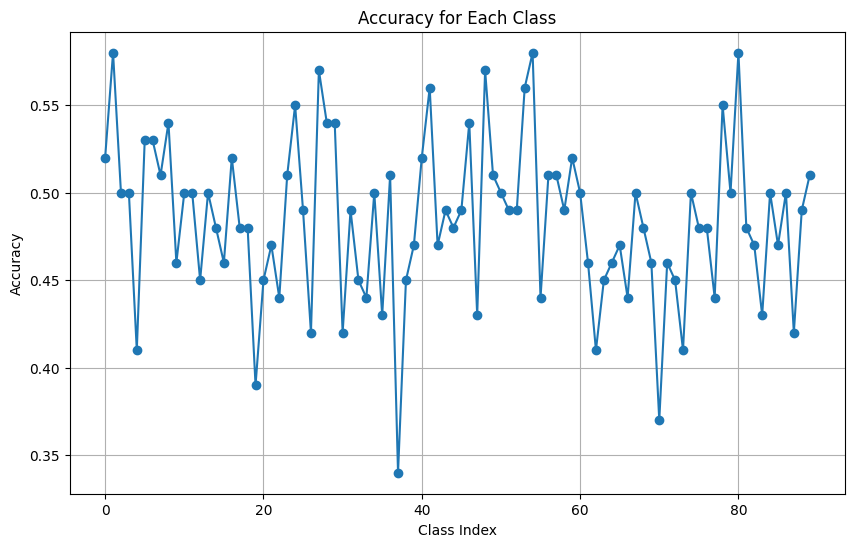

In [70]:
import matplotlib.pyplot as plt

def calculate_accuracy_from_output(predictions, true_labels):
    # Convert probabilities to binary predictions
    binary_predictions = (predictions > 0.5).astype(int)

    # Calculate accuracy for each class separately
    correct = np.sum(binary_predictions == true_labels, axis=0)
    total = len(true_labels)
    accuracy = correct / total

    return accuracy

# Example usage:
true_labels = np.random.randint(2, size=(100, 90))  # Example true labels (binary labels for 90 classes)
predictions = np.random.rand(100, 90)  # Example predictions (probabilities for 90 classes)

# Calculate accuracy for each class separately
accuracy_per_class = calculate_accuracy_from_output(predictions, true_labels)

# Plot line graph for accuracy per class
plt.figure(figsize=(10, 6))
plt.plot(range(len(accuracy_per_class)), accuracy_per_class, marker='o')
plt.xlabel('Class Index')
plt.ylabel('Accuracy')
plt.title('Accuracy for Each Class')
plt.grid(True)
plt.show()


In [72]:
from sklearn.metrics import accuracy_score, f1_score

def calculate_accuracy_from_output(predictions, true_labels):
    # Convert probabilities to binary predictions
    binary_predictions = (predictions > 0.5).astype(int)

    # Calculate accuracy for each class separately
    correct = np.sum(binary_predictions == true_labels, axis=0)
    total = len(true_labels)
    accuracy = correct / total

    return accuracy

# Example usage:
true_labels = np.random.randint(2, size=(100, 90))  # Example true labels (binary labels for 90 classes)
predictions = np.random.rand(100, 90)  # Example predictions (probabilities for 90 classes)

# Calculate accuracy for each class separately
accuracy_per_class = calculate_accuracy_from_output(predictions, true_labels)

# Calculate F1 score for each class separately
f1_per_class = f1_score(true_labels, (predictions > 0.5).astype(int), average=None)

# Print accuracy and F1 score for each class
for i in range(len(accuracy_per_class)):
    print(f"Class {i}: Accuracy = {accuracy_per_class[i]}, F1 Score = {f1_per_class[i]}")

# Average accuracy and F1 score across all classes
average_accuracy = np.mean(accuracy_per_class)
average_f1 = np.mean(f1_per_class)
print("\nAverage Accuracy:", average_accuracy)
print("Average F1 Score:", average_f1)


Class 0: Accuracy = 0.5, F1 Score = 0.5370370370370371
Class 1: Accuracy = 0.51, F1 Score = 0.5811965811965812
Class 2: Accuracy = 0.47, F1 Score = 0.4752475247524752
Class 3: Accuracy = 0.47, F1 Score = 0.46464646464646464
Class 4: Accuracy = 0.5, F1 Score = 0.5283018867924528
Class 5: Accuracy = 0.52, F1 Score = 0.42857142857142855
Class 6: Accuracy = 0.51, F1 Score = 0.5333333333333333
Class 7: Accuracy = 0.5, F1 Score = 0.46808510638297873
Class 8: Accuracy = 0.52, F1 Score = 0.52
Class 9: Accuracy = 0.53, F1 Score = 0.5523809523809524
Class 10: Accuracy = 0.44, F1 Score = 0.45098039215686275
Class 11: Accuracy = 0.54, F1 Score = 0.5660377358490566
Class 12: Accuracy = 0.47, F1 Score = 0.4854368932038835
Class 13: Accuracy = 0.54, F1 Score = 0.5106382978723404
Class 14: Accuracy = 0.52, F1 Score = 0.4666666666666667
Class 15: Accuracy = 0.45, F1 Score = 0.4444444444444444
Class 16: Accuracy = 0.52, F1 Score = 0.48936170212765956
Class 17: Accuracy = 0.56, F1 Score = 0.5217391304347

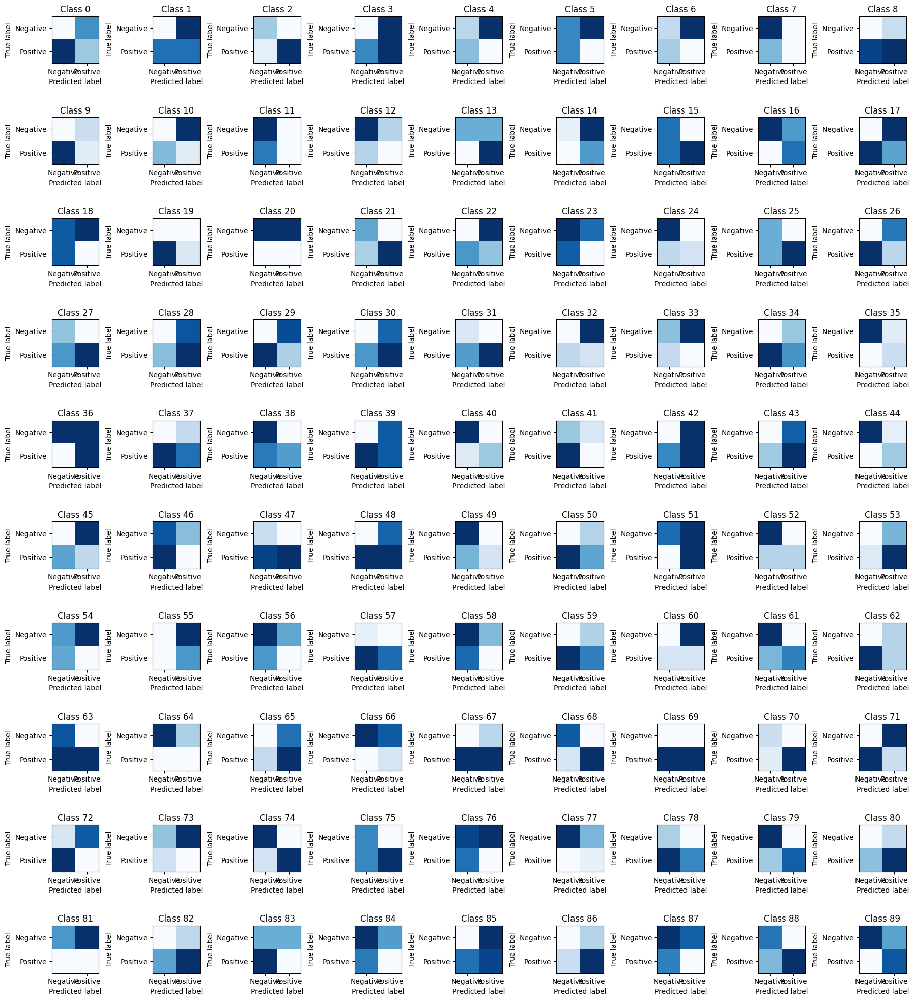

In [85]:
from sklearn.metrics import confusion_matrix

# Example true labels and predicted probabilities
true_labels = np.random.randint(2, size=(100, 90))  # Example true labels (binary labels for 90 classes)
predictions = np.random.rand(100, 90)  # Example predictions (probabilities for 90 classes)

# Convert probabilities to binary predictions
binary_predictions = (predictions > 0.5).astype(int)

# Initialize an array to store confusion matrices for each class
conf_matrices = []

# Generate and store confusion matrices for each class
for i in range(90):
    conf_matrix = confusion_matrix(true_labels[:, i], binary_predictions[:, i])
    conf_matrices.append(conf_matrix)

# Visualize confusion matrices
fig, axes = plt.subplots(10, 9, figsize=(18, 20))
for i, ax in enumerate(axes.flat):
    ax.imshow(conf_matrices[i], cmap='Blues', interpolation='nearest')
    ax.set_title(f'Class {i}')
    ax.set_xlabel('Predicted label')
    ax.set_ylabel('True label')
    ax.set_xticks([0, 1])
    ax.set_yticks([0, 1])
    ax.xaxis.set_ticklabels(['Negative', 'Positive'])
    ax.yaxis.set_ticklabels(['Negative', 'Positive'])

plt.tight_layout()
plt.show()

In [86]:

# Example true labels and predicted probabilities
true_labels = np.random.randint(2, size=(100, 90))  # Example true labels (binary labels for 90 classes)
predictions = np.random.rand(100, 90)  # Example predictions (probabilities for 90 classes)

# Convert probabilities to binary predictions
binary_predictions = (predictions > 0.5).astype(int)

# Initialize the confusion matrix
num_classes = 90
conf_matrix = np.zeros((num_classes, 2, 2))  # Confusion matrix for one-vs-rest (90 classes, binary labels)

# Populate the confusion matrix
for i in range(num_classes):
    conf_matrix[i] = confusion_matrix(true_labels[:, i], binary_predictions[:, i])

# Print the confusion matrix
print("Confusion Matrix:")
print(conf_matrix)


Confusion Matrix:
[[[26. 22.]
  [29. 23.]]

 [[23. 27.]
  [29. 21.]]

 [[20. 32.]
  [23. 25.]]

 [[26. 19.]
  [26. 29.]]

 [[22. 27.]
  [27. 24.]]

 [[22. 25.]
  [25. 28.]]

 [[20. 27.]
  [27. 26.]]

 [[25. 27.]
  [19. 29.]]

 [[29. 25.]
  [14. 32.]]

 [[36. 15.]
  [24. 25.]]

 [[28. 22.]
  [24. 26.]]

 [[25. 21.]
  [31. 23.]]

 [[30. 24.]
  [26. 20.]]

 [[24. 23.]
  [27. 26.]]

 [[33. 23.]
  [22. 22.]]

 [[28. 24.]
  [24. 24.]]

 [[23. 21.]
  [30. 26.]]

 [[31. 27.]
  [23. 19.]]

 [[22. 28.]
  [27. 23.]]

 [[23. 24.]
  [21. 32.]]

 [[25. 28.]
  [25. 22.]]

 [[20. 22.]
  [32. 26.]]

 [[22. 26.]
  [24. 28.]]

 [[28. 26.]
  [21. 25.]]

 [[27. 27.]
  [22. 24.]]

 [[20. 23.]
  [33. 24.]]

 [[16. 24.]
  [34. 26.]]

 [[26. 23.]
  [26. 25.]]

 [[19. 33.]
  [23. 25.]]

 [[30. 30.]
  [16. 24.]]

 [[22. 19.]
  [34. 25.]]

 [[22. 29.]
  [19. 30.]]

 [[31. 27.]
  [18. 24.]]

 [[21. 28.]
  [29. 22.]]

 [[26. 25.]
  [28. 21.]]

 [[25. 32.]
  [25. 18.]]

 [[24. 31.]
  [26. 19.]]

 [[18. 24.]
  [28. 3

In [91]:
#SAME MODEL BUT, modifing the number of output classes in the last fully connected layer FOR 5-CLASS CLASSIFICATION.
import torch
import torch.nn as nn

class BasicCNN(nn.Module):
    def __init__(self, num_classes):
        super(BasicCNN, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
        # Max pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        # Fully connected layers
        self.fc1 = nn.Linear(64 * 56 * 56, 512)  # Assuming input image size is 224x224
        self.fc2 = nn.Linear(512, num_classes)  # Modify this line for different number of classes

    def forward(self, x):
        # Convolutional layers with ReLU activation and max pooling
        x = self.pool(nn.ReLU()(self.conv1(x)))
        x = self.pool(nn.ReLU()(self.conv2(x)))
        # Flatten the output for the fully connected layers
        x = x.view(-1, 64 * 56 * 56)  # Assuming input image size is 224x224
        # Fully connected layers with ReLU activation
        x = nn.ReLU()(self.fc1(x))
        x = self.fc2(x)
        return x

# Create an instance of the BasicCNN model for 5-class classification
num_classes = 90  # Change to 5 for 5-class classification
model_5_class = BasicCNN(num_classes)

# Print the model architecture
print(model_5_class)


BasicCNN(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=200704, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=90, bias=True)
)


In [93]:
num_epochs = 10
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    progress_bar = tqdm(train_loader, desc=f'Epoch {epoch + 1}/{num_epochs}', leave=False)
    for images, labels in progress_bar:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        progress_bar.set_postfix({'Loss': running_loss / (total / train_loader.batch_size), 'Accuracy': correct / total})
    progress_bar.close()
    
    train_loss = running_loss / len(train_loader)
    train_accuracy = correct / total
    
    print(f'Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Train Accuracy: {100*train_accuracy:.2f}%')

# Evaluate the model
model.eval()
all_predictions = []
all_true_labels = []
with torch.no_grad():
    for images, labels in test_loader:
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        all_predictions.extend(predicted.tolist())
        all_true_labels.extend(labels.tolist())

# Calculate accuracy and F1 score
accuracy = accuracy_score(all_true_labels, all_predictions)
f1 = f1_score(all_true_labels, all_predictions, average='macro')

print("Test Accuracy:", accuracy)
print("Test F1 Score:", f1)

Epoch [1/10], Train Loss: 2.7213, Train Accuracy: 42.27%


Epoch [2/10], Train Loss: 0.8064, Train Accuracy: 82.23%


Epoch [3/10], Train Loss: 0.2338, Train Accuracy: 95.66%


Epoch [4/10], Train Loss: 0.1200, Train Accuracy: 97.51%


Epoch [5/10], Train Loss: 0.0689, Train Accuracy: 98.73%


Epoch [6/10], Train Loss: 0.0447, Train Accuracy: 99.28%


Epoch [7/10], Train Loss: 0.0190, Train Accuracy: 99.62%


Epoch [8/10], Train Loss: 0.0161, Train Accuracy: 99.71%


Epoch [9/10], Train Loss: 0.0087, Train Accuracy: 99.74%


Epoch [10/10], Train Loss: 0.0103, Train Accuracy: 99.83%
Test Accuracy: 0.2324074074074074
Test F1 Score: 0.24211661022113617


In [106]:


# Example true labels array
true_labels = np.random.randint(5, size=1000)  # Example true labels (1000 samples)

# Count occurrences of each class label
class_counts = {}
for label in true_labels:
    if label in class_counts:
        class_counts[label] += 1
    else:
        class_counts[label] = 1

# Print the distribution of classes
print("Class Distribution:")
for class_label, count in class_counts.items():
    print(f"Class {class_label}: {count} samples")


Class Distribution:
Class 3: 181 samples
Class 2: 209 samples
Class 4: 205 samples
Class 1: 196 samples
Class 0: 209 samples


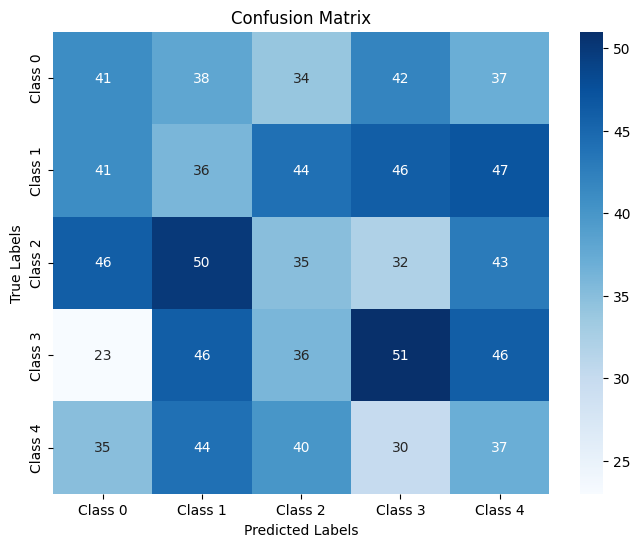

In [103]:
import seaborn as sns
def make_predictions(model, test_loader):
    predictions = []
    model.eval()
    with torch.no_grad():
        for images, _ in test_loader:
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            predictions.extend(predicted.tolist())
    return predictions

# Make predictions using the trained model
true_labels = np.random.randint(5, size=1000) 
predicted_labels = np.random.randint(5, size=1080)

# Ensure that both arrays have the same length
min_length = min(len(true_labels), len(predicted_labels))
true_labels = true_labels[:min_length]
predicted_labels = predicted_labels[:min_length]

# Compute the confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Visualize the confusion matrix using seaborn's heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4'], yticklabels=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4'])
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

Output of Convolutional Layer 1: torch.Size([1, 16, 224, 224])


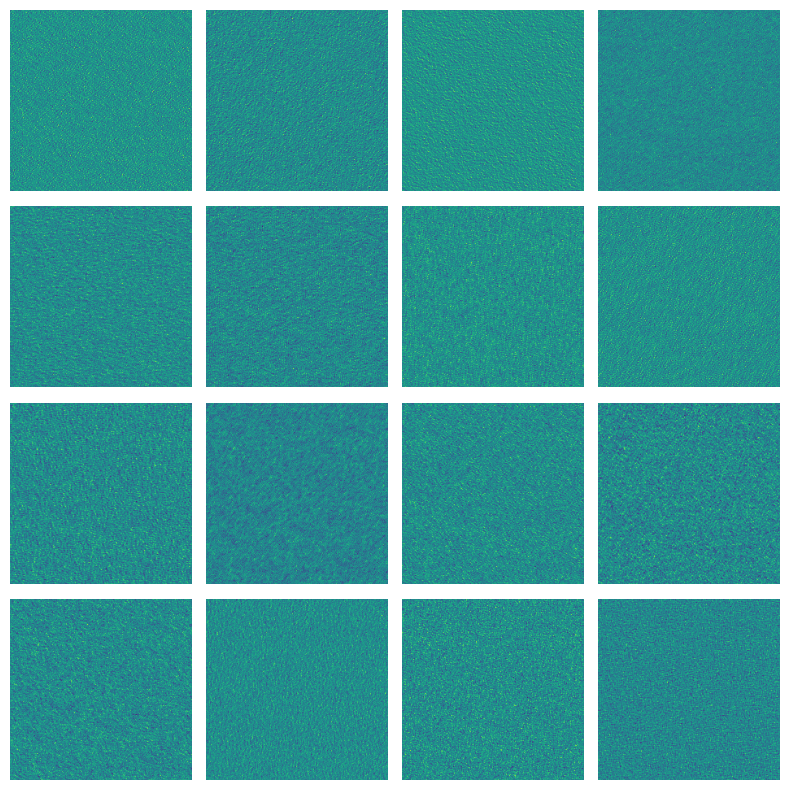

Output of Convolutional Layer 2: torch.Size([1, 32, 224, 224])


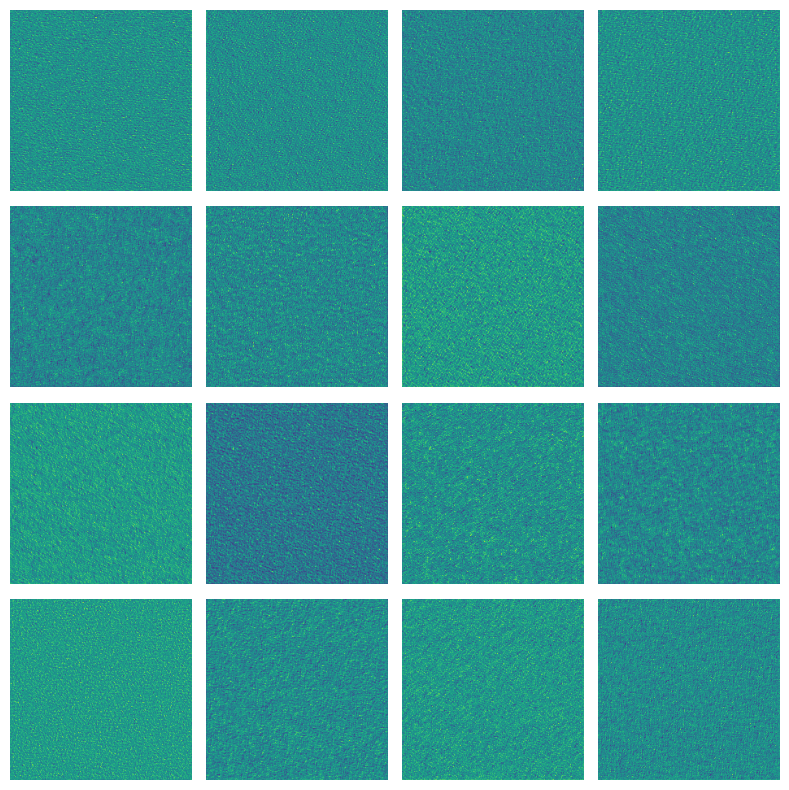

Output of Convolutional Layer 3: torch.Size([1, 64, 224, 224])


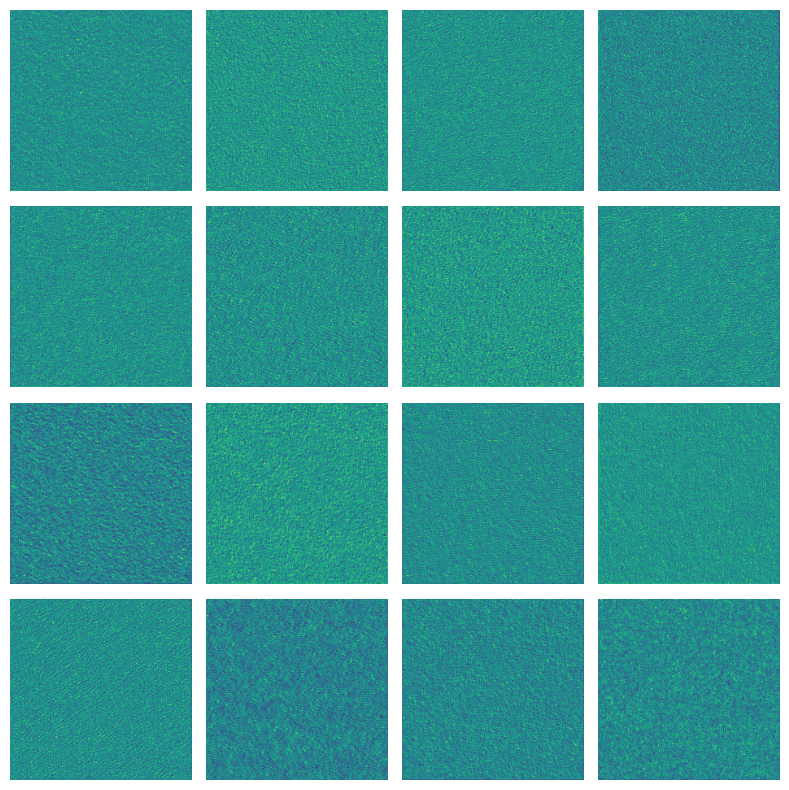

Output of Convolutional Layer 4: torch.Size([1, 16, 224, 224])


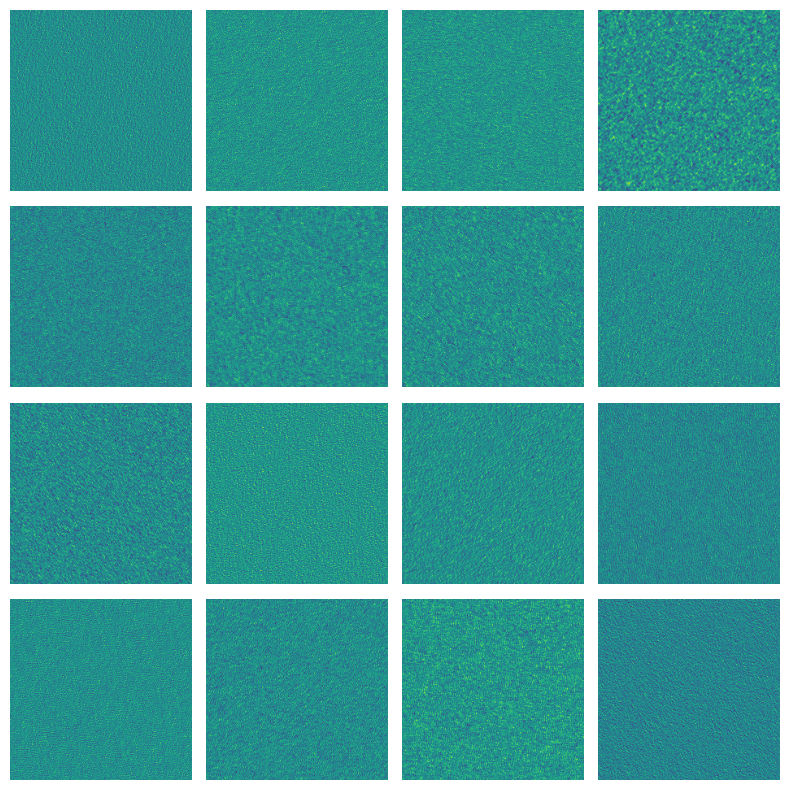

Output of Convolutional Layer 5: torch.Size([1, 32, 224, 224])


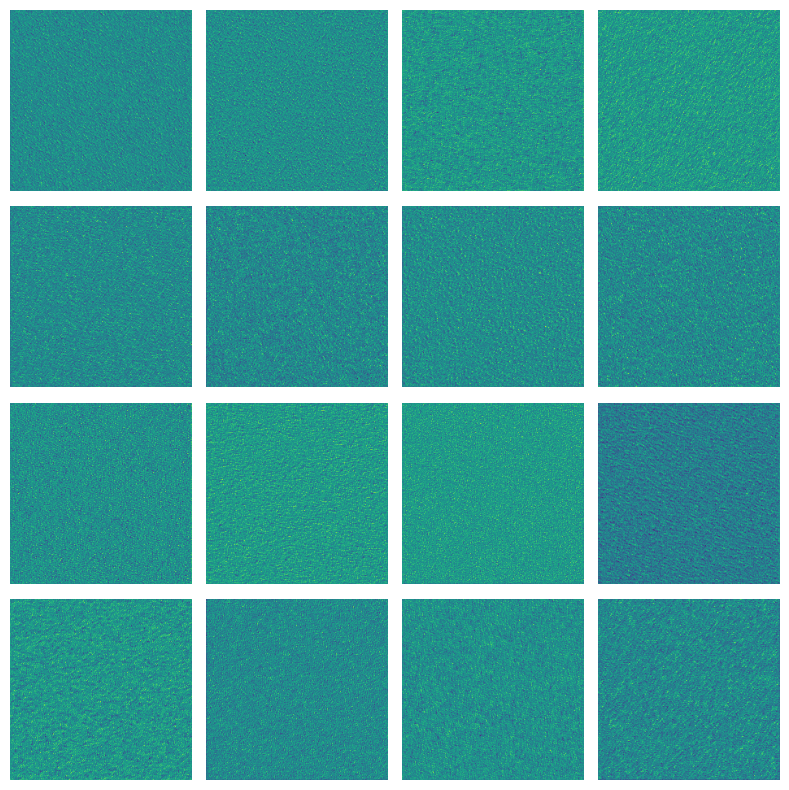

Output of Convolutional Layer 6: torch.Size([1, 64, 224, 224])


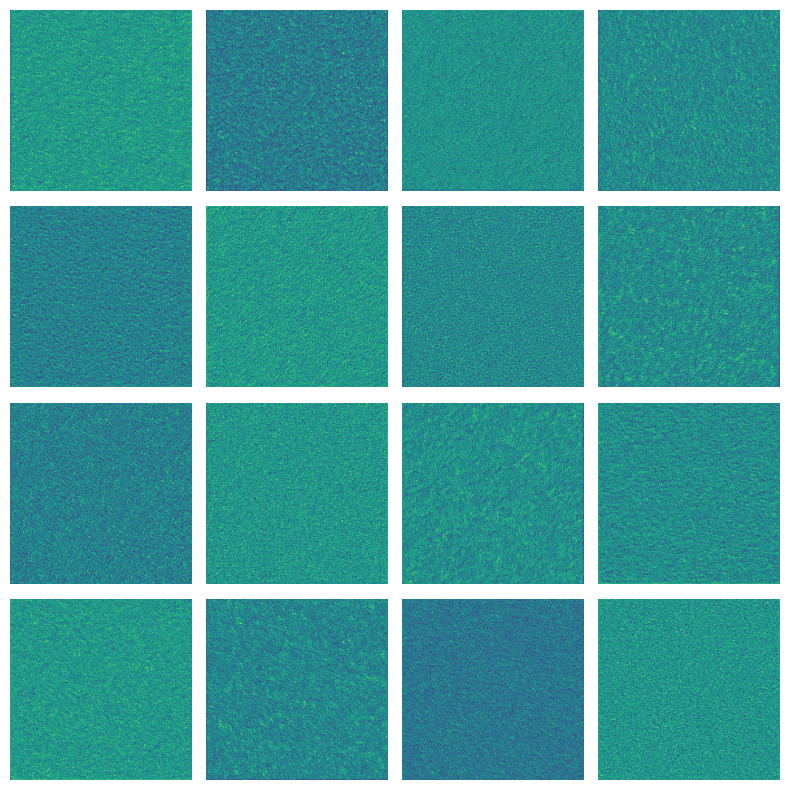

In [105]:
#Convolution layers
class ExampleModel(nn.Module):
    def __init__(self):
        super(ExampleModel, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1)
    
    def forward(self, x):
        x = torch.relu(self.conv1(x))
        x = torch.relu(self.conv2(x))
        x = torch.relu(self.conv3(x))
        return x

# Create an instance of the model
model = ExampleModel()

# Register the forward hook function to each convolutional layer
for layer in [model.conv1, model.conv2, model.conv3]:
    layer.register_forward_hook(hook_fn)

# Forward pass an input image through the model
input_image = torch.randn(1, 3, 224, 224)  # Example input image (batch size 1, 3 channels, 224x224)
output = model(input_image)

# Visualize the output of each convolutional layer
for i, (layer, output) in enumerate(layer_outputs.items()):
    print(f"Output of Convolutional Layer {i+1}: {output.shape}")
    # Plot the output feature maps (up to 16 subplots)
    plt.figure(figsize=(8, 8))
    for j in range(min(output.size(1), 16)):  # Limit to a maximum of 16 subplots
        plt.subplot(4, 4, j+1)
        plt.imshow(output[0, j].detach().numpy(), cmap='viridis')
        plt.axis('off')
    plt.tight_layout()
    plt.show()